# Relationship between Provincial Governance Index and other data in attracting FDI in Vietnam across provinces

## I - Introduction

### I.I Description

Foreign direct investment (FDI) has played a vital role in Viet Nam’s economic growth strategy during the reform period. Foreign investors bring much needed capital, technology, access to international markets and improved management practices to Viet Nam. Local authorities, well aware of the benefits of foreign investment to the local economy, compete with each other to attract investors to their provinces and districts. This paper explores the relationship between Provincial Governance Index (PCI) and other data in attracting FDI in Vietnam across provinces.


### I.II Problem


If weare investor, we expect to see the provinces where there is hight PCI and other data like income, industrial zone, labour for better investment. If weare Politician, we will known whereis the disadvantaged provinces should be proactive in helping themselves by building up their human capital, improving the quality of provincial governance, creating a good investment environment.

## I.III Data Description

We report that province-specific per-capita income, secondary education enrolment, labor costs, openness to trade, and domestic investment affect FDI directly within the province itself and have indirect effects on FDI in neighboring provinces.

    Map of provinces in Viet Nam, I download as Json file in OpenDevelopment [1] website.

    GENERAL STATISTICS OFFICE of VIET NAM [2] I export all data i need for this project:
        Percentage of trained employed workers at 15 years of age and above by province
        Foreign direct investment projects licensed in 2018 by province
        Index of Industrial production by province
        Monthly average income per capita in 2016 at current prices by income quintile and by province

    PCI from The Provincial Competitiveness Index [3] website.


## II. Methodology

### II.1 First, i create Map of Viet Nam province 

In [ ]:
!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab

In [2]:
import os
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
import numpy as np
import folium

In [3]:
from geopy.geocoders import Nominatim
address = 'VietNam'

geolocator = Nominatim(user_agent="vn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Viet Nam are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Viet Nam are 13.2904027, 108.4265113.


In [14]:
import json
import requests
url = 'https://data.opendevelopmentmekong.net/dataset/999c96d8-fae0-4b82-9a2b-e481f6f50e12/resource/2818c2c5-e9c3-440b-a9b8-3029d7298065/download'
geo_u = f'{url}/diaphantinhenglish.geojson'
geo_json_data = json.loads(requests.get(geo_u).text)

map_vietnam = folium.Map(location=[latitude, longitude], zoom_start=5)

world_geo = r'world_countries.json' # geojson file
folium.GeoJson(
    geo_json_data,
    name='geojson'
).add_to(map_vietnam)
map_vietnam

### II.2 Load data of FDI 

In [9]:
# The code was removed by Watson Studio for sharing.

     Province    Total
0      Ha Noi  33134.7
1   Vinh Phuc   4527.1
2    Bac Ninh  17289.0
3  Quang Ninh   6231.3
4   Hai Duong   7758.3
Province     object
Total       float64
dtype: object


The data of GeoJson and data FDI is connect together with "Province" name,
Check all Province name is same or not. If not, correct them.

In [16]:
geo_provinces = set(geo_json_data['properties']['Name'] for geo_json_data in geo_json_data['features'])
df_geo = pd.DataFrame(data = geo_provinces )
df_geo.columns = ['Province']
df_geo.head()

,Province
0,Da Nang
1,Ca Mau
2,Ben Tre
3,Hung Yen
4,Lang Son


In [18]:
c11 = df_geo['Province'].isin(df_data_fdi['Province'])
cc11 = df_geo.Province.mask(c11).dropna()
print('value same map to data: ',c11.value_counts())

d1 = df_data_fdi['Province'].isin(df_geo['Province'])
dd1 = df_data_fdi.Province.mask(d1).dropna()
print('value same data to map: ',d1.value_counts())

value same map to data:  True    63
Name: Province, dtype: int64
value same data to map:  True    63
Name: Province, dtype: int64


## II.3 Create Choropleth map of FDI

In [20]:
df_data_2  = df_data_fdi.set_index('Province')['Total']
#df_data_2 = df_data_1.to_dict()
df_data_2['Binh Dinh']

806.3

In [21]:
min, max = df_data_fdi['Total'].quantile([0.05,0.95]).apply(lambda x: round(x, 2))
mean = round(df_data_fdi['Total'].mean(),2)
print(f"Min: {min}", f"Max: {max}", f"Mean: {mean}", sep="\n\n")

Min: 12.3

Max: 29759.95

Mean: 5366.36


In [24]:
import branca
colormap = branca.colormap.LinearColormap(
    colors=['#f2f0f7','#cbc9e2','#9e9ac8','#756bb1','#54278f'],
    index=df_data_fdi['Total'].quantile([0.2,0.4,0.6,0.8]),
    vmin=min,
    vmax=max
)

colormap.caption="Population Density in the United States"

colormap

In [25]:
folium.GeoJson(
    geo_json_data,
    style_function=lambda feature: {
        'fillColor': colormap(df_data_2[feature['properties']['Name']]),
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 5',
        'fillOpacity': 0.5,
    }
).add_to(map_vietnam)
folium.LayerControl().add_to(map_vietnam)
# display the map of Viet Nam
map_vietnam

### II.4 Load Industrial data of Viet Nam Province

In [36]:

body = client_167a17d9b59349e09512026d7743d974.get_object(Bucket='finprojectlocatoin-donotdelete-pr-3cqtrj7i5f8vt6',Key='province data.xlsx')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_province = pd.read_excel(body)
df_data_province['employed workers at 15 years'] = df_data_province['employed workers at 15 years'].str.replace(',','.').astype(float)
df_data_province['Index of Industrial production'] = df_data_province['Index of Industrial production'].str.replace(',','.').astype(float)
df_data_province['Income'] = df_data_province['Income'].astype(float)
df_data_province['PCI'] = df_data_province['PCI'].astype(float)
df_data_province.head()

,Province,employed workers at 15 years,Index of Industrial production,Income,PCI
0,Ha Noi,42.1,107.0,4875.0,65.40
1,Vinh Phuc,21.5,107.5,2860.0,64.55
2,Bac Ninh,26.1,135.5,4308.0,64.50
3,Quang Ninh,33.0,103.1,3747.0,70.36
4,Hai Duong,20.2,109.6,3169.0,60.98


Add Latitude and Longtitude to each Province

In [42]:
geolocator = Nominatim(user_agent="vn_explorer")
latitude=[]
longitude=[]
for province in df_data_province['Province']:
    address = province
    location = geolocator.geocode(address)
    latitude.append(location.latitude)
    longitude.append(location.longitude)
    
df_data_province.insert(0, 'Longtitude', longitude,allow_duplicates=True)
df_data_province.insert(0, 'latitude', latitude,allow_duplicates=True)
df_data_province.head()

,latitude,Longtitude,Province,employed workers at 15 years,Index of Industrial production,Income,PCI
0,21.029450,105.854444,Ha Noi,42.1,107.0,4875.0,65.40
1,21.311356,105.603294,Vinh Phuc,21.5,107.5,2860.0,64.55
2,21.121205,106.088025,Bac Ninh,26.1,135.5,4308.0,64.50
3,10.043497,105.782998,Quang Ninh,33.0,103.1,3747.0,70.36
4,20.944368,106.378037,Hai Duong,20.2,109.6,3169.0,60.98


In [38]:
from sklearn import metrics 
from scipy.spatial.distance import cdist 
X = df_data_province.drop('Province', 1)
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)     
      
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

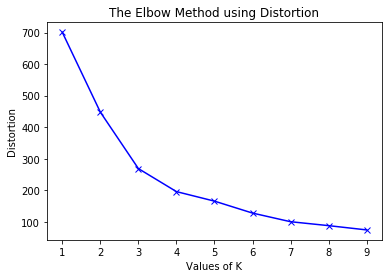

In [41]:
import matplotlib.pyplot as plt

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 


Caculate and add clustering labels 

In [30]:
from sklearn.cluster import KMeans
# set number of clusters
kclusters = 7

vietnam_grouped_clustering = df_data_province.drop('Province', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(vietnam_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 2, 0, 2, 2, 0, 2, 2, 2, 2], dtype=int32)

In [43]:
df_data_province.insert(0, 'Cluster Labels', kmeans.labels_,allow_duplicates=True)
df_data_province.head()

,Cluster Labels,latitude,Longtitude,Province,employed workers at 15 years,Index of Industrial production,Income,PCI
0,0,21.029450,105.854444,Ha Noi,42.1,107.0,4875.0,65.40
1,2,21.311356,105.603294,Vinh Phuc,21.5,107.5,2860.0,64.55
2,0,21.121205,106.088025,Bac Ninh,26.1,135.5,4308.0,64.50
3,2,10.043497,105.782998,Quang Ninh,33.0,103.1,3747.0,70.36
4,2,20.944368,106.378037,Hai Duong,20.2,109.6,3169.0,60.98


In [45]:
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_data_province['latitude'], df_data_province['Longtitude'], df_data_province['Province'], df_data_province['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_vietnam)
    
colormap.caption = 'FDI Investment In Viet Nam province'
colormap.add_to(map_vietnam)       
map_vietnam

## III. Discussion

The Latitude and Longtitude get from Nominatim not correct in some province.
Viet Nam with 63 province, is such a complexity, very different approaches can be tried in clustering and classification studies.
Moreover, there is another classification method can apply to analysis this case,
but i chose the easy method so the result will not have high quality.

## IV. Conclusion

As a result, Investor will see the provinces where there is hight PCI and other data like income, industrial zone, labour for better investment.

And Politician will known where is the disadvantaged provinces should be proactive in helping themselves by building up their human capital, improving the quality of provincial governance, creating a good investment environment.

## V. References

[1] https://data.vietnam.opendevelopmentmekong.net/

[2] https://www.gso.gov.vn/

[3] https://www.researchgate.net/publication/228119928_Provincial_Governance_and_Foreign_Direct_Investment_in_Vietnam